In [3]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
sns.set_style("whitegrid")
sns.set(rc={'figure.figsize':(10,8)})

import jpype
from jpype import JArray, JDouble, JInt

In [4]:
def validate_numpy_array(func):
    """ Convert any iterable to numpy array """
    def wrapper(*args, **kwargs):
        for item in args:
            try:
                # convert iterable to numpy array
                len(item)
                item = np.array(item)
            except TypeError as e:
                continue
        return func(*args, **kwargs)

    return wrapper

class ContinuousInfoEstimator:
    def __init__(self, jar_location=None, estimator='kraskov'):
        self.estimator = estimator
        
        if not jar_location:
            project_dir = 'Dropbox/Documents/Classes/InfoTheory'
            jidt_dir = os.path.join(os.environ['HOME'], project_dir)
            jar_location = os.path.join(jidt_dir, 'infodynamics-dist-1.5/infodynamics.jar')
            
        assert os.path.exists(jar_location), 'jar file not found: ' + jar_location

        # Start the JVM (add the "-Xmx" option with say 1024M if you get crashes due to not enough memory space)
        try:
            jpype.startJVM(jpype.getDefaultJVMPath(), "-ea", "-Djava.class.path=" + jar_location)
            
            # load package
            self.pkg = jpype.JPackage(f"infodynamics.measures.continuous.{estimator}")
            print('Estimator ready.')
        except OSError:
            print("Failed to start JVM. Check $JAVA_HOME environmental var.")
        
    def list_calculators(self):
        return [item for item in dir(self.pkg) if item[0].isupper() and item[0].isalpha()]
    
    @validate_numpy_array
    def transfer_entropy(self, src, dest, k=1, nearest_neighbors=4, normalize=True, auto_embed=False, compute_significance=False, n_samples=100):
        """ calculate transfer entropy in nats. """
        src = np.array(src)
        dest = np.array(dest)
        
        assert len(src) == len(dest), f'Length mismatch: {len(src)}, {len(dest)}'
        
        if self.estimator == 'gaussian':
            calc = self.pkg.TransferEntropyCalculatorGaussian()
        elif self.estimator == 'kraskov':
            calc = self.pkg.TransferEntropyCalculatorKraskov()
        
            if auto_embed:
                calc.setProperty("AUTO_EMBED_METHOD", "MAX_CORR_AIS_DEST_ONLY")
            else:
                normalize_var = 'true' if normalize else 'false'
                calc.setProperty("NORMALISE", normalize_var) # Normalise the individual variables
                calc.setProperty("k", f"{nearest_neighbors}") # Use Kraskov parameter K=4 for 4 nearest points                
        
        calc.initialise(k) # Use history length k
        
        src_arr = JArray(JDouble, 1)(src.tolist())
        dest_arr = JArray(JDouble, 1)(dest.tolist())

        calc.setObservations(src_arr, dest_arr)
        
        if compute_significance:
            return calc.computeAverageLocalOfObservations(), calc.computeSignificance(n_samples).pValue
        else:
            return calc.computeAverageLocalOfObservations()
    
    @validate_numpy_array
    def active_information_storage(self, arr, k=3):
        calc = self.pkg.ActiveInfoStorageCalculatorKraskov()
        
        # 2. Set any properties to non-default values:
        calc.setProperty("k_HISTORY", f"{k}")
        calc.initialise()
        calc.setObservations(arr)
        return calc.computeAverageLocalOfObservations()
    
# utility functions
def pct_change(df):
    return (df['adj_close'] - df['adj_close'].shift(1)) / df['adj_close'].shift(1)

def daily_return(df):
    return np.log(df['adj_close']) - np.log(df['adj_close'].shift(1))

def compute_std(df):
    return np.sqrt(np.sum((df['daily_return'] - df['daily_return'].mean()) ** 2) / (len(df) - 1))

In [5]:
estimator = 'kraskov'

In [6]:
try:
    options = calc.list_calculators()
except NameError:
    calc = ContinuousInfoEstimator(estimator=estimator)
    options = calc.list_calculators()
    
for item in options:
    print(item)

Estimator ready.
ActiveInfoStorageCalculatorKraskov
ActiveInfoStorageCalculatorMultiVariateKraskov
ConditionalMutualInfoCalculatorMultiVariateKraskov
ConditionalMutualInfoCalculatorMultiVariateKraskov1
ConditionalMutualInfoCalculatorMultiVariateKraskov2
ConditionalTransferEntropyCalculatorKraskov
MultiInfoCalculatorKraskov
MultiInfoCalculatorKraskov1
MultiInfoCalculatorKraskov2
MutualInfoCalculatorMultiVariateKraskov
MutualInfoCalculatorMultiVariateKraskov1
MutualInfoCalculatorMultiVariateKraskov2
PredictiveInfoCalculatorKraskov
TransferEntropyCalculatorKraskov
TransferEntropyCalculatorMultiVariateKraskov


# Economy-level information transfer

## Indices used

| Index    | Name                                     | Country | n   | Source                                                                 |
|----------|------------------------------------------|---------|-----|------------------------------------------------------------------------|
| `^GSPC`  | S&P 500                                  | USA     | 500 | [Link](https://finance.yahoo.com/quote/%5EGSPC/)                       |
| `^N100`  | Euronext 100                             | Europe  | 100 | [Link](https://finance.yahoo.com/quote/%5EN100/)                       |
| `^N225`  | Nikkei 225                               | Japan   | 225 | [Link](https://finance.yahoo.com/quote/%5EN225/)                       |
| `^BVSP`  | Bovespa Index                            | Brazil  | 70  | [Link](https://finance.yahoo.com/quote/%5EBVSP/)                       |

- price expressed in local currency (USD, JPY, EUR, BRL)


## External module used

https://github.com/gregversteeg/NPEET/blob/master/npeet/entropy_estimators.py

In [7]:
# code in this cell is borrowed from https://github.com/gregversteeg/NPEET/blob/master/npeet/entropy_estimators.py
from scipy.special import digamma
from sklearn.neighbors import KDTree

def entropy(x, k=4, base=2):
    """ The classic K-L k-nearest neighbor continuous entropy estimator
        x should be a list of vectors, e.g. x = [[1.3], [3.7], [5.1], [2.4]]
        if x is a one-dimensional scalar and we have four samples
    """
    assert k <= len(x) - 1, "Set k smaller than num. samples - 1"
    x = np.asarray(x)
    n_elements, n_features = x.shape
    x = add_noise(x)
    tree = build_tree(x)
    nn = query_neighbors(tree, x, k)
    const = digamma(n_elements) - digamma(k) + n_features * np.log(2)
    return (const + n_features * np.log(nn).mean()) / np.log(base)

def add_noise(x, intens=1e-10):
    # small noise to break degeneracy, see doc.
    return x + intens * np.random.random_sample(x.shape)

def query_neighbors(tree, x, k):
    return tree.query(x, k=k + 1)[0][:, k]

def build_tree(points):
    if points.shape[1] >= 20:
        return BallTree(points, metric='chebyshev')
    return KDTree(points, metric='chebyshev')

# Data preprocess

## Read data

In [8]:
dfs = {}
for file in os.listdir('data/index'):
    if file.startswith('^'):
        fn, ext = os.path.splitext(file)
        dfs[fn[1:]] = pd.read_csv(os.path.join('data/index', file))
        
dfs.keys()

dict_keys(['N225', 'GSPC', 'N100', 'BVSP'])

In [9]:
for df in dfs.values():
    df.columns = [col.lower().replace(' ', '_') for col in df.columns]
    df['date'] = pd.to_datetime(df['date'])

In [10]:
for key in dfs.keys():
    print(key)
    print(dfs[key]['date'].describe(datetime_is_numeric=True))
    print('')

N225
count                            14356
mean     1992-08-16 21:16:48.080245120
min                1965-01-06 00:00:00
25%                1978-10-09 18:00:00
50%                1992-07-11 12:00:00
75%                2006-04-13 06:00:00
max                2020-10-29 00:00:00
Name: date, dtype: object

GSPC
count                            23317
mean     1974-07-03 11:10:15.259252912
min                1928-01-03 00:00:00
25%                1951-05-04 00:00:00
50%                1974-08-09 00:00:00
75%                1997-08-29 00:00:00
max                2020-10-28 00:00:00
Name: date, dtype: object

N100
count                             5357
mean     2010-05-17 12:58:27.933544960
min                2000-01-03 00:00:00
25%                2005-02-18 00:00:00
50%                2010-05-13 00:00:00
75%                2015-08-07 00:00:00
max                2020-10-30 00:00:00
Name: date, dtype: object

BVSP
count                             6984
mean     2006-11-27 21:07:50.103092992
mi

## Compute Daily return

$$
r_t=\ln{p}_t-\ln{p}_{t-1}
$$

In [11]:
for df in dfs.values():
    # df['pct_change'] = pct_change(df)
    df['daily_return'] = daily_return(df)

In [12]:
dfs['GSPC'].head()

,date,open,high,low,close,adj_close,volume,daily_return
0,1928-01-03,17.760000,17.760000,17.760000,17.760000,17.760000,0,NaN
1,1928-01-04,17.719999,17.719999,17.719999,17.719999,17.719999,0,-0.002255
2,1928-01-05,17.549999,17.549999,17.549999,17.549999,17.549999,0,-0.009640
3,1928-01-06,17.660000,17.660000,17.660000,17.660000,17.660000,0,0.006248
4,1928-01-09,17.500000,17.500000,17.500000,17.500000,17.500000,0,-0.009101


## Merge data

In [13]:
from functools import reduce
cols = ['open', 'high', 'low', 'close', 'adj_close', 'volume']

for key in dfs.keys():
    dfs[key].rename(columns={'daily_return': key}, inplace=True)
    dfs[key].drop(cols, 1, inplace=True)

f = lambda left, right: pd.merge(left, right, on='date', how='inner')
data = reduce(f, dfs.values())
data.head()

,date,N225,GSPC,N100,BVSP
0,2000-01-03,NaN,-0.009595,NaN,NaN
1,2000-01-04,NaN,-0.039099,-0.041794,-0.065855
2,2000-01-05,-0.024521,0.001920,-0.027262,0.024553
3,2000-01-06,-0.020391,0.000955,-0.008420,-0.008531
4,2000-01-07,0.001383,0.026730,0.022955,0.012463


In [14]:
data.isnull().sum()

date      0
N225    205
GSPC      0
N100     36
BVSP    143
dtype: int64

In [15]:
data = data.fillna(method='ffill', limit=4)
data.head()

,date,N225,GSPC,N100,BVSP
0,2000-01-03,NaN,-0.009595,NaN,NaN
1,2000-01-04,NaN,-0.039099,-0.041794,-0.065855
2,2000-01-05,-0.024521,0.001920,-0.027262,0.024553
3,2000-01-06,-0.020391,0.000955,-0.008420,-0.008531
4,2000-01-07,0.001383,0.026730,0.022955,0.012463


In [16]:
data.isnull().sum()

date    0
N225    6
GSPC    0
N100    1
BVSP    1
dtype: int64

In [17]:
data.dropna(inplace=True)

# Analysis

In [18]:
data

,date,N225,GSPC,N100,BVSP
2,2000-01-05,-0.024521,0.001920,-0.027262,0.024553
3,2000-01-06,-0.020391,0.000955,-0.008420,-0.008531
4,2000-01-07,0.001383,0.026730,0.022955,0.012463
5,2000-01-10,0.001383,0.011128,0.017163,0.042790
6,2000-01-11,0.001383,-0.013149,-0.006436,-0.026732
...,...,...,...,...,...
4886,2020-10-22,-0.007012,0.005205,-0.001982,0.013494
4887,2020-10-23,0.001801,0.003440,0.007600,-0.006477
4888,2020-10-26,-0.000947,-0.018764,-0.016265,-0.002403
4889,2020-10-27,-0.000364,-0.003030,-0.010426,-0.014066


In [19]:
data.describe()

,N225,GSPC,N100,BVSP
count,4885.000000,4885.000000,4885.000000,4885.000000
mean,-0.000054,0.000154,0.000019,0.000352
std,0.014694,0.012465,0.013142,0.017945
min,-0.121110,-0.127652,-0.127517,-0.159930
25%,-0.007039,-0.004813,-0.005979,-0.009430
50%,0.000278,0.000588,0.000604,0.000584
75%,0.007945,0.005805,0.006518,0.010869
max,0.132346,0.102457,0.084688,0.130223


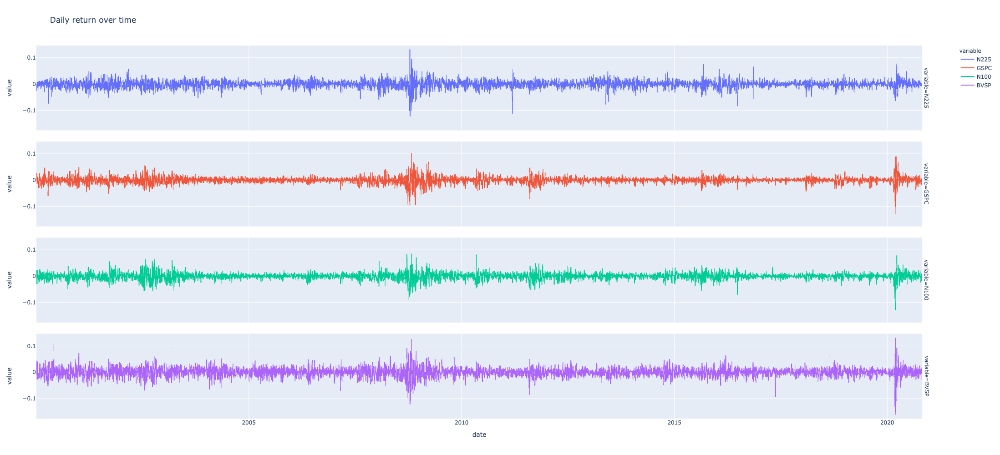

In [20]:
df = pd.melt(data, id_vars=['date'])
px.line(df, x='date', y='value', color='variable', facet_row='variable', title='Daily return over time', height=1000, width=1000)

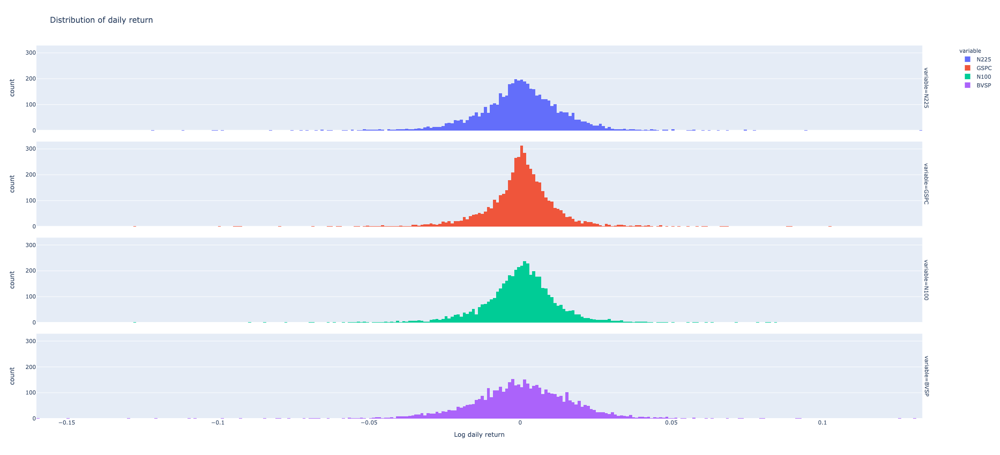

In [55]:
px.histogram(df, x='value', color='variable', facet_row='variable', width=1000, height=1000, title='Distribution of daily return', labels={'value': 'Log daily return'})

## Shannon entropy

In [22]:
data.isnull().sum()

date    0
N225    0
GSPC    0
N100    0
BVSP    0
dtype: int64

In [23]:
data.dropna(inplace=True)

In [24]:
print('entropy')
for col in data.columns:
    if col != 'date':
        h = entropy(data[col].dropna().values.reshape(-1, 1), base=math.e)
        print(f"{col} : {h:.2f}")

entropy
N225 : -3.01
GSPC : -3.12
N100 : -3.05
BVSP : -2.70


## Transfer Entropy - USA and Japan

In [25]:
select_data = data[['date', 'GSPC', 'N225']]
select_data = select_data[select_data['date'] < '2020-10-01']

In [26]:
select_data['date'].describe(datetime_is_numeric=True)

count                             4866
mean     2010-03-07 07:41:39.136868096
min                2000-01-05 00:00:00
25%                2004-11-10 06:00:00
50%                2010-01-28 12:00:00
75%                2015-06-17 18:00:00
max                2020-09-30 00:00:00
Name: date, dtype: object

In [27]:
select_data.isnull().sum()

date    0
GSPC    0
N225    0
dtype: int64

In [28]:
calc.list_calculators()

['ActiveInfoStorageCalculatorKraskov',
 'ActiveInfoStorageCalculatorMultiVariateKraskov',
 'ConditionalMutualInfoCalculatorMultiVariateKraskov',
 'ConditionalMutualInfoCalculatorMultiVariateKraskov1',
 'ConditionalMutualInfoCalculatorMultiVariateKraskov2',
 'ConditionalTransferEntropyCalculatorKraskov',
 'MultiInfoCalculatorKraskov',
 'MultiInfoCalculatorKraskov1',
 'MultiInfoCalculatorKraskov2',
 'MutualInfoCalculatorMultiVariateKraskov',
 'MutualInfoCalculatorMultiVariateKraskov1',
 'MutualInfoCalculatorMultiVariateKraskov2',
 'PredictiveInfoCalculatorKraskov',
 'TransferEntropyCalculatorKraskov',
 'TransferEntropyCalculatorMultiVariateKraskov']

### Monthly

In [29]:
cols = ['year', 'month', 't_GSPCtoN225', 't_N225toGSPC']
indices = ['GSPC', 'N225']
K = 4
monthly_stats = []

for yr in range(1993, 2021):
    for mm in range(1, 13):
        t_data = select_data[(select_data['date'].dt.year == yr) & (select_data['date'].dt.month == mm)]
        if len(t_data) > K:
            row = [yr, mm]
            row += calc.transfer_entropy(src=t_data['GSPC'].values, dest=t_data['N225'].values, k=1, nearest_neighbors=K),
            row += calc.transfer_entropy(src=t_data['N225'].values, dest=t_data['GSPC'].values, k=1, nearest_neighbors=K),
            monthly_stats += row,

monthly = pd.DataFrame(monthly_stats, columns=cols)
monthly['yymmdd'] = monthly['year'].astype(str) + '-' + monthly['month'].astype(str)
monthly['yymmdd'] = pd.to_datetime(monthly['yymmdd'])
monthly.head()

,year,month,t_GSPCtoN225,t_N225toGSPC,yymmdd
0,2000,1,-0.012061,-0.059268,2000-01-01
1,2000,2,0.075308,-0.036129,2000-02-01
2,2000,3,-0.032728,-0.055256,2000-03-01
3,2000,4,0.118796,0.004676,2000-04-01
4,2000,5,0.175229,-0.031737,2000-05-01


In [30]:
f = lambda x: max(0, x)
monthly['t_GSPCtoN225'] = monthly['t_GSPCtoN225'].apply(f)
monthly['t_N225toGSPC'] = monthly['t_N225toGSPC'].apply(f)

In [31]:
monthly.describe()

,year,month,t_GSPCtoN225,t_N225toGSPC
count,249.000000,249.000000,249.000000,249.000000
mean,2009.879518,6.445783,0.074649,0.022053
std,6.002817,3.442803,0.075162,0.035816
min,2000.000000,1.000000,0.000000,0.000000
25%,2005.000000,3.000000,0.006179,0.000000
50%,2010.000000,6.000000,0.057980,0.000000
75%,2015.000000,9.000000,0.115554,0.033758
max,2020.000000,12.000000,0.331706,0.251322


In [32]:
# monthly.style.bar(subset=['t_GSPCtoN225', 't_N225toGSPC'], align='left', color='#5fba7d')

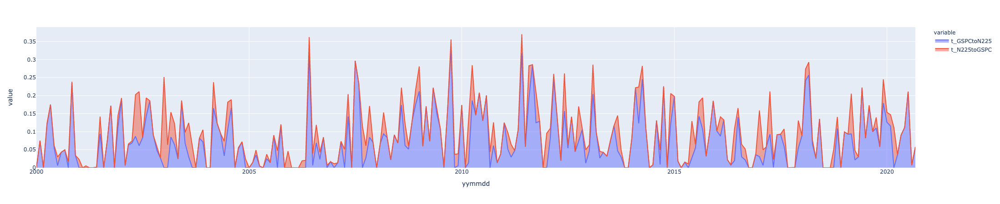

In [33]:
# where red area is above blue area is where SPY has more influence on Nikkei than the other way around
px.area(monthly, x='yymmdd', y=['t_GSPCtoN225', 't_N225toGSPC'])

In [34]:
# px.line(monthly, x='yymmdd', y=['t_GSPCtoN225', 't_N225toGSPC'])

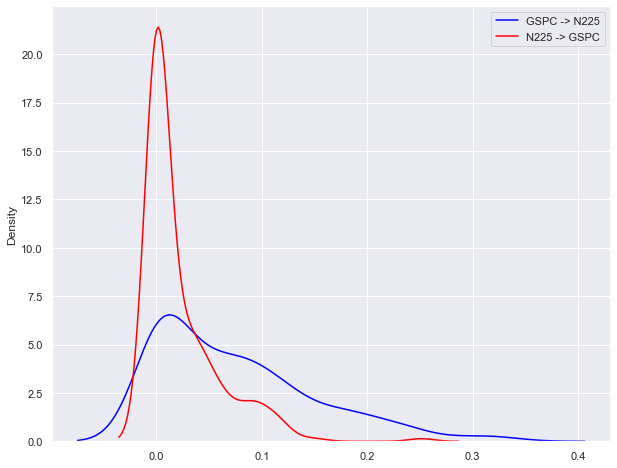

In [35]:
sns.kdeplot(monthly['t_GSPCtoN225'].values, color='blue', label='GSPC -> N225')
sns.kdeplot(monthly['t_N225toGSPC'].values, color='red', label='N225 -> GSPC')
plt.legend()

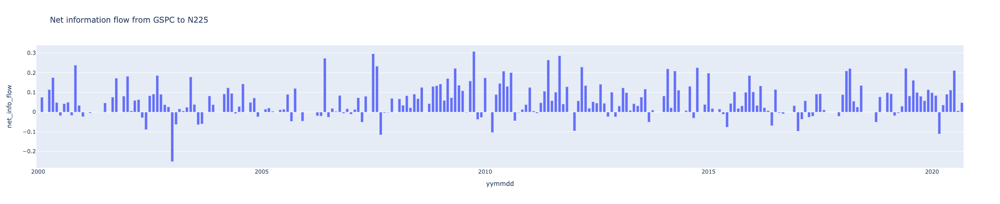

In [36]:
f = lambda x: max(x, 0)
monthly['net_info_flow'] = monthly['t_GSPCtoN225'].apply(f) - monthly['t_N225toGSPC'].apply(f)
px.bar(monthly, x='yymmdd', y='net_info_flow', title='Net information flow from GSPC to N225')

In [37]:
# net information flow from GSPC -> N225
# monthly[['year', 'month', 'net_info_flow']].style.bar(subset=['net_info_flow'], align='mid', color=['#d65f5f', '#5fba7d'])

### Yearly

In [38]:
cols = ['year', 't_GSPCtoN225', 't_N225toGSPC']
indices = ['GSPC', 'N225']
K = 4
yearly_stats = []

for yr in range(1993, 2021):
    t_data = select_data[select_data['date'].dt.year == yr]
    if len(t_data) > K:
        row = [yr]
        row += calc.transfer_entropy(src=t_data['GSPC'].values, dest=t_data['N225'].values, nearest_neighbors=K),
        row += calc.transfer_entropy(src=t_data['N225'].values, dest=t_data['GSPC'].values, nearest_neighbors=K),
        yearly_stats += row,

yearly = pd.DataFrame(yearly_stats, columns=cols)
yearly['yymmdd'] = yearly['year'].astype(str) + '-01-01'
yearly['yymmdd'] = pd.to_datetime(yearly['yymmdd'])
f = lambda x: max(0, x)
yearly['t_GSPCtoN225'] = yearly['t_GSPCtoN225'].apply(f)
yearly['t_N225toGSPC'] = yearly['t_N225toGSPC'].apply(f)

,year,t_GSPCtoN225,t_N225toGSPC,yymmdd
0,2000,0.072982,0.003568,2000-01-01
1,2001,0.043448,0.000000,2001-01-01
2,2002,0.069751,0.008767,2002-01-01
3,2003,0.089150,0.000000,2003-01-01
4,2004,0.046556,0.000993,2004-01-01
5,2005,0.054815,0.036079,2005-01-01
6,2006,0.069950,0.000000,2006-01-01
7,2007,0.120493,0.000000,2007-01-01
8,2008,0.152673,0.001503,2008-01-01
9,2009,0.207931,0.030833,2009-01-01


In [44]:
yearly.describe()

,year,t_GSPCtoN225,t_N225toGSPC
count,21.000000,21.000000,21.000000
mean,2010.000000,0.132444,0.014938
std,6.204837,0.073019,0.019059
min,2000.000000,0.039395,0.000000
25%,2005.000000,0.069751,0.000000
50%,2010.000000,0.125985,0.003568
75%,2015.000000,0.201544,0.030833
max,2020.000000,0.269289,0.054382


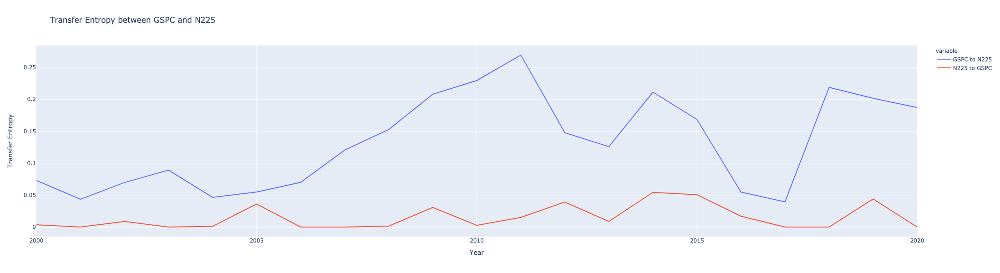

In [53]:
px.line(yearly.rename(columns={'t_GSPCtoN225': 'GSPC to N225', 't_N225toGSPC': 'N225 to GSPC'}), x='year', y=['GSPC to N225', 'N225 to GSPC'], title='Transfer Entropy between GSPC and N225', width=1000, height=600, labels={'value':'Transfer Entropy', 'year':'Year'})

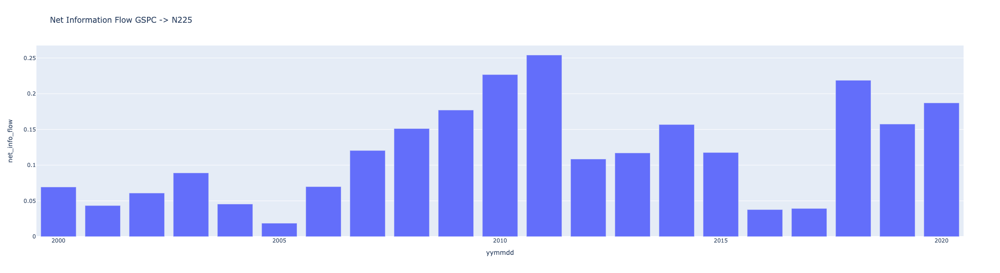

In [46]:
yearly['net_info_flow'] = yearly['t_GSPCtoN225'].apply(f) - yearly['t_N225toGSPC'].apply(f)
px.bar(yearly, x='yymmdd', y='net_info_flow', title='Net Information Flow GSPC -> N225', width=1000, height=600)

In [52]:
# net information flow from GSPC -> N225
yearly.drop('yymmdd', 1).rename(columns={'t_GSPCtoN225': 'GSPC to N225', 't_N225toGSPC': 'N225 to GSPC'}).style.bar(subset=['GSPC to N225', 'N225 to GSPC', 'net_info_flow'], align='mid', color=['#d65f5f', '#5fba7d'], axis=None)

,year,GSPC to N225,N225 to GSPC,net_info_flow
0,2000,0.072982,0.003568,0.069414
1,2001,0.043448,0.000000,0.043448
2,2002,0.069751,0.008767,0.060984
3,2003,0.089150,0.000000,0.089150
4,2004,0.046556,0.000993,0.045563
5,2005,0.054815,0.036079,0.018736
6,2006,0.069950,0.000000,0.069950
7,2007,0.120493,0.000000,0.120493
8,2008,0.152673,0.001503,0.151170
9,2009,0.207931,0.030833,0.177098


In [48]:
print(yearly.drop('yymmdd', 1).to_markdown(index=False))

|   year |   t_GSPCtoN225 |   t_N225toGSPC |   net_info_flow |
|-------:|---------------:|---------------:|----------------:|
|   2000 |      0.0729822 |     0.00356808 |       0.0694141 |
|   2001 |      0.0434476 |     0          |       0.0434476 |
|   2002 |      0.069751  |     0.00876744 |       0.0609835 |
|   2003 |      0.0891499 |     0          |       0.0891499 |
|   2004 |      0.0465559 |     0.0009934  |       0.0455625 |
|   2005 |      0.0548151 |     0.0360793  |       0.0187358 |
|   2006 |      0.0699504 |     0          |       0.0699504 |
|   2007 |      0.120493  |     0          |       0.120493  |
|   2008 |      0.152673  |     0.00150333 |       0.15117   |
|   2009 |      0.207931  |     0.0308328  |       0.177098  |
|   2010 |      0.229401  |     0.00264219 |       0.226759  |
|   2011 |      0.269289  |     0.0151899  |       0.254099  |
|   2012 |      0.147744  |     0.0392109  |       0.108533  |
|   2013 |      0.125985  |     0.00887057 |       0.11

### All periods + statistical significance

In [41]:
k = 1

In [56]:
USAtoJP, p1 = calc.transfer_entropy(src=select_data['GSPC'].values, dest=select_data['N225'].values, nearest_neighbors=K, compute_significance=True, n_samples=100)
print(USAtoJP, p1)
USAtoJP, p1 = calc.transfer_entropy(src=select_data['GSPC'].values, dest=select_data['N225'].values, nearest_neighbors=K, compute_significance=True, n_samples=100, k=7)
print(USAtoJP, p1)

0.13255940049378423 0.0
0.09599340794637734 0.0


In [57]:
USAtoJP, p1 = calc.transfer_entropy(src=select_data['GSPC'].values, dest=select_data['N225'].values, nearest_neighbors=K, compute_significance=True, n_samples=100)
JPtoUSA, p2 = calc.transfer_entropy(src=select_data['N225'].values, dest=select_data['GSPC'].values, nearest_neighbors=K, compute_significance=True, n_samples=100)
print(USAtoJP, p1)
print(JPtoUSA, p2)
print(USAtoJP - JPtoUSA)

0.13265537558837215 0.0
0.01844362837195823 0.01
0.11421174721641392


In [47]:
if p1 < 0.05 and p2 < 0.05:
    print('statistically significant')
else:
    print('not statistically significant')

statistically significant


## Transfer Entropy - Japan and Brazil

In [56]:
select_data = data[['date', 'N225', 'BVSP']]
select_data = select_data[select_data['date'] < '2020-10-01']

In [57]:
cols = ['year', 't_N225toBVSP', 't_BVSPtoN225']
indices = ['N225', 'BVSP']
K = 4
yearly_stats = []

for yr in range(1993, 2021):
    t_data = select_data[select_data['date'].dt.year == yr]
    if len(t_data) > K:
        row = [yr]
        row += calc.transfer_entropy(src=t_data['N225'].values, dest=t_data['BVSP'].values, nearest_neighbors=K),
        row += calc.transfer_entropy(src=t_data['BVSP'].values, dest=t_data['N225'].values, nearest_neighbors=K),
        yearly_stats += row,

yearly = pd.DataFrame(yearly_stats, columns=cols)
yearly['yymmdd'] = yearly['year'].astype(str) + '-01-01'
yearly['yymmdd'] = pd.to_datetime(yearly['yymmdd'])
f = lambda x: max(0, x)
yearly['t_N225toBVSP'] = yearly['t_N225toBVSP'].apply(f)
yearly['t_BVSPtoN225'] = yearly['t_BVSPtoN225'].apply(f)

In [58]:
yearly.describe()

,year,t_N225toBVSP,t_BVSPtoN225
count,21.000000,21.000000,21.000000
mean,2010.000000,0.016027,0.046686
std,6.204837,0.020345,0.045892
min,2000.000000,0.000000,0.000000
25%,2005.000000,0.000000,0.010862
50%,2010.000000,0.005340,0.024410
75%,2015.000000,0.027285,0.080967
max,2020.000000,0.062779,0.146024


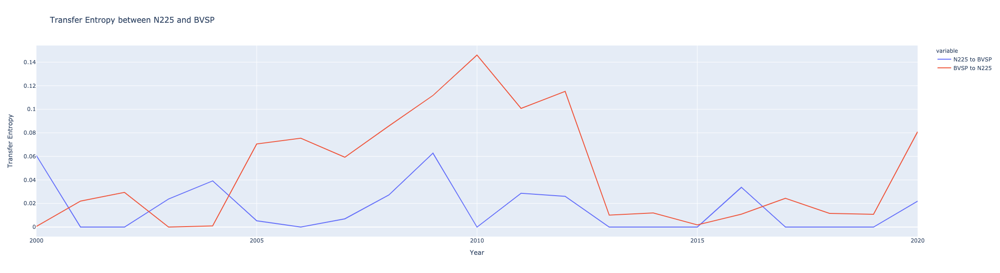

In [59]:
px.line(yearly.rename(columns={'t_N225toBVSP': 'N225 to BVSP', 't_BVSPtoN225': 'BVSP to N225'}), x='year', y=['N225 to BVSP', 'BVSP to N225'], title='Transfer Entropy between N225 and BVSP', width=1000, height=600, labels={'value':'Transfer Entropy', 'year':'Year'})

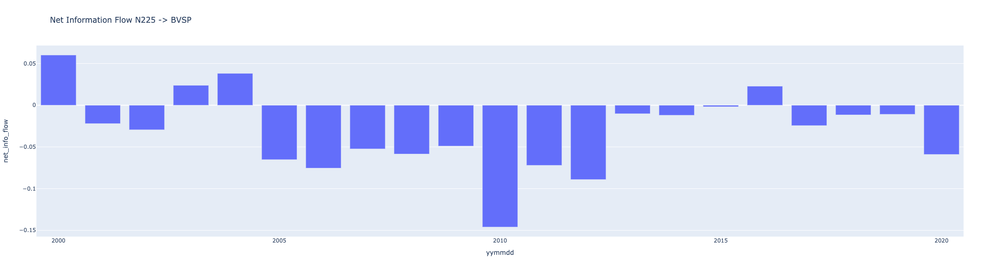

In [60]:
yearly['net_info_flow'] = yearly['t_N225toBVSP'] - yearly['t_BVSPtoN225']
px.bar(yearly, x='yymmdd', y='net_info_flow', title='Net Information Flow N225 -> BVSP', width=1000, height=600)

In [61]:
# net information flow from N225 -> BVSP
yearly.drop('yymmdd', 1).rename(columns={'t_N225toBVSP': 'N225 to BVSP', 't_BVSPtoN225': 'BVSP to N225'}).style.bar(subset=['N225 to BVSP', 'BVSP to N225', 'net_info_flow'], align='mid', color=['#d65f5f', '#5fba7d'], axis=None)

,year,N225 to BVSP,BVSP to N225,net_info_flow
0,2000,0.060687,0.000548,0.060138
1,2001,0.000000,0.022047,-0.022047
2,2002,0.000000,0.029409,-0.029409
3,2003,0.023842,0.000000,0.023842
4,2004,0.039160,0.000975,0.038184
5,2005,0.005340,0.070567,-0.065228
6,2006,0.000000,0.075411,-0.075411
7,2007,0.006961,0.059290,-0.052329
8,2008,0.027285,0.085786,-0.058501
9,2009,0.062779,0.111751,-0.048972


### All periods + statistical significance

In [62]:
k = 1

In [63]:
JPtoBVSP, p1 = calc.transfer_entropy(src=select_data['N225'].values, dest=select_data['BVSP'].values, nearest_neighbors=K, compute_significance=True, n_samples=100)
BVSPtoJP, p2 = calc.transfer_entropy(src=select_data['BVSP'].values, dest=select_data['N225'].values, nearest_neighbors=K, compute_significance=True, n_samples=100)
print(JPtoBVSP, p1)
print(BVSPtoJP, p2)
print(JPtoBVSP - BVSPtoJP)

0.009472571032241195 0.17
0.03597280447156126 0.0
-0.026500233439320064


In [64]:
if p1 < 0.05 and p2 < 0.05:
    print('statistically significant')
else:
    print('not statistically significant')

not statistically significant


## Transfer Entropy Matrix / Contribution

In [78]:
data.isnull().sum()

date    0
N225    0
GSPC    0
N100    0
BVSP    0
dtype: int64

In [79]:
data['date'].describe(datetime_is_numeric=True)

count                             4885
mean     2010-03-22 09:22:08.720573184
min                2000-01-05 00:00:00
25%                2004-11-17 00:00:00
50%                2010-02-12 00:00:00
75%                2015-07-10 00:00:00
max                2020-10-28 00:00:00
Name: date, dtype: object

In [80]:
indices = [col for col in data.columns if col != 'date']
indices

['N225', 'GSPC', 'N100', 'BVSP']

In [81]:
all_transfer_entropy = np.zeros((len(indices), len(indices)))
all_transfer_entropy.shape

(4, 4)

In [82]:
for src_idx in range(len(indices)):
    for dest_idx in range(len(indices)):
        all_transfer_entropy[src_idx][dest_idx] = calc.transfer_entropy(src=data[indices[src_idx]].values, 
                                                                        dest=data[indices[dest_idx]].values, 
                                                                        nearest_neighbors=K)
        all_transfer_entropy[src_idx][dest_idx] = max(0, all_transfer_entropy[src_idx][dest_idx])

Row index -> source index

Column -> Destination index

In [83]:
df = pd.DataFrame(all_transfer_entropy, columns=indices, index=indices)
df.style.background_gradient(axis=None)

,N225,GSPC,N100,BVSP
N225,0.000000,0.018025,0.022727,0.010265
GSPC,0.131616,0.000000,0.051718,0.005814
N100,0.084654,0.034900,0.000000,0.000000
BVSP,0.036232,0.000000,0.003004,0.000000


Text(0.5, 79.5, 'Destination')

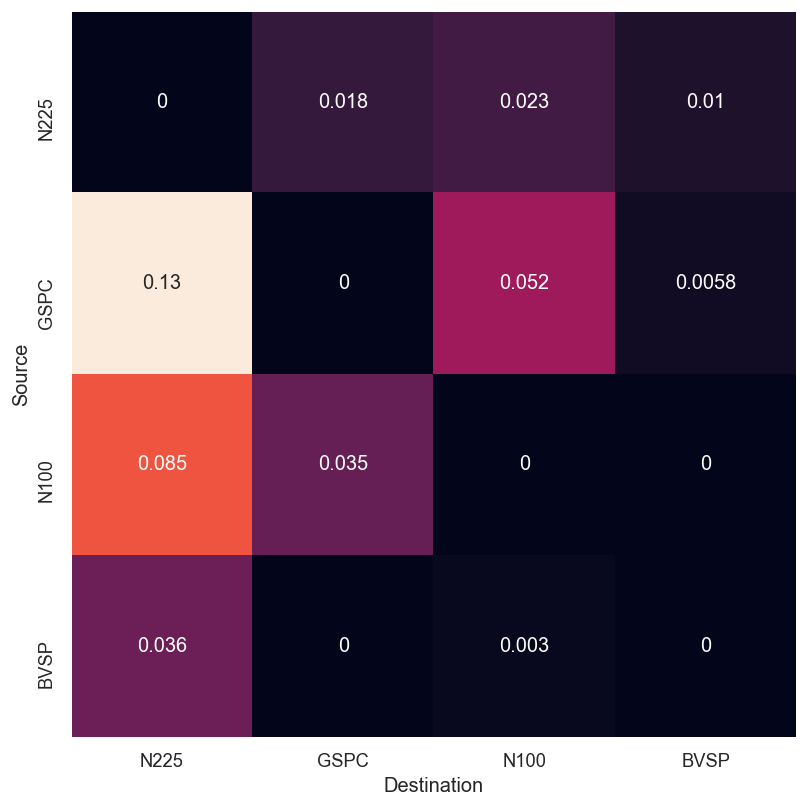

In [84]:
plt.figure(figsize=(8,8), dpi=120)
sns.heatmap(df, annot=True, square=True, cbar=False)
plt.ylabel('Source')
plt.xlabel('Destination')

## Total Transfer Entropy Contribution by Market

In [85]:
# row wise summation = summation by source
te = df.values.sum(axis=1)
# normalize
te /= te.sum()

df = pd.DataFrame(np.stack([indices, te]).T, columns=['ETF', 'Transfer_entropy_contrib'])
df.rename(columns={'ETF':'index'}, inplace=True)
df.sort_values('Transfer_entropy_contrib', ascending=False, inplace=True)
df

,index,Transfer_entropy_contrib
1,GSPC,0.4741071138363235
2,N100,0.29966909312946194
0,N225,0.1278768951474355
3,BVSP,0.09834689788677912


In [86]:
print(df.to_markdown(index=False))

| index   |   Transfer_entropy_contrib |
|:--------|---------------------------:|
| GSPC    |                  0.474107  |
| N100    |                  0.299669  |
| N225    |                  0.127877  |
| BVSP    |                  0.0983469 |


# Industry-level information transfer

## ETF used

| Index   | Name                                      |Industry        | Source                                                                 |
|---------|-------------------------------------------|----------------|------------------------------------------------------------------------|
| `USO`   | United States Oil Fund                    |Oil             | [Link](https://finance.yahoo.com/quote/USO/)                           |
| `ICLN`  | iShares Global Clean Energy ETF           |Renewable Energy| [Link](https://finance.yahoo.com/quote/ICLN/)                          |
| `JETS`  | U.S. Global Jets ETF                      |Airline         | [Link](https://finance.yahoo.com/quote/JETS/)                          |
| `IYT`   | iShares Transportation Average ETF        |Transportation  | [Link](https://finance.yahoo.com/quote/IYT/)                           |
| `XLP`   | Consumer Staples Select Sector SPDR Fund  |Consumer staples| [Link](https://finance.yahoo.com/quote/XLP/)                           |
| `SMH`   | VanEck Vectors Semiconductor ETF          |Semiconductor   | [Link](https://finance.yahoo.com/quote/SMH/)                           |
| `IXP`   | iShares Global Comm Services ETF          |Telecom         | [Link](https://finance.yahoo.com/quote/IXP/)                           |
| `VGT`   | Vanguard Information Technology Index Fund|Technology      | [Link](https://finance.yahoo.com/quote/VGT/)                           |
| `XPH`   | SPDR S&P Pharmaceuticals ETF              |Pharmaceutical  | [Link](https://finance.yahoo.com/quote/XPH/)                           |

<!-- | `ESPO`  | VanEck Vectors Video Gaming & eSports ETF |Gaming          | [Link](https://finance.yahoo.com/quote/ESPO/)                          | -->
<!-- | `ARKG`  | ARK Genomic Revolution ETF                |Healthcare      | [Link](https://finance.yahoo.com/quote/ARKG/)                          | -->

In [87]:
industries = {
    'USO' : 'Oil',
    'ICLN': 'Renewable Energy',
    'JETS': 'Airline',
    'IYT' : 'Transportation',
    'XLP' : 'Consumer Staples',
    'SMH' : 'Semiconductor',
    'IXP' : 'Telecom',
    'VGT': 'Technology',
    'XPH' : 'Pharmaceutical'
}

## Import data

In [88]:
dfs = {}
path = 'data/etf'
for file in os.listdir(path):
    if file.endswith('csv'):
        fn, ext = os.path.splitext(file)
        dfs[fn] = pd.read_csv(os.path.join(path, file))
        
dfs.keys()

dict_keys(['XPH', 'SMH', 'ICLN', 'JETS', 'XLP', 'USO', 'IXP', 'IYT', 'VGT'])

In [89]:
for df in dfs.values():
    df.columns = [col.lower().replace(' ', '_') for col in df.columns]
    df['date'] = pd.to_datetime(df['date'])

In [90]:
for key in dfs.keys():
    print(f"{key:>4} {dfs[key]['date'].dt.date.min()} {dfs[key]['date'].dt.date.max()}")

 XPH 2006-07-03 2020-10-30
 SMH 2000-07-03 2020-10-30
ICLN 2008-07-01 2020-10-30
JETS 2015-05-01 2020-10-30
 XLP 1999-01-04 2020-10-30
 USO 2006-05-01 2020-10-30
 IXP 2001-12-03 2020-10-30
 IYT 2004-01-05 2020-10-30
 VGT 2004-02-02 2020-10-30


In [91]:
for df in dfs.values():
    df['daily_return'] = daily_return(df)

In [92]:
from functools import reduce
cols = ['open', 'high', 'low', 'close', 'adj_close', 'volume']

for key in dfs.keys():
    dfs[key].rename(columns={'daily_return': key}, inplace=True)
    dfs[key].drop(cols, 1, inplace=True)

f = lambda left, right: pd.merge(left, right, on='date', how='outer')
etf = reduce(f, dfs.values())
etf.head()

,date,XPH,SMH,ICLN,JETS,XLP,USO,IXP,IYT,VGT
0,2006-07-03,NaN,0.012981,NaN,NaN,0.005771,0.002291,0.007590,0.011234,0.010543
1,2006-07-05,0.0,-0.027982,NaN,NaN,-0.008254,0.015185,-0.007019,-0.011911,-0.022512
2,2006-07-06,0.0,-0.001762,NaN,NaN,0.011537,-0.003245,0.003610,-0.007147,0.002187
3,2006-07-07,0.0,-0.016220,NaN,NaN,-0.002050,-0.013085,-0.004753,-0.008921,-0.012308
4,2006-07-10,0.0,-0.022580,NaN,NaN,0.006138,-0.004160,0.002855,0.004471,-0.015377


In [93]:
etf.isnull().sum()

date       0
XPH     1886
SMH      379
ICLN    2388
JETS    4108
XLP        1
USO     1842
IXP      733
IYT     1258
VGT     1277
dtype: int64

## Transfer Entropy of all pairs of indices

In [94]:
cols = [col for col in etf.columns if col != 'date']
cols

['XPH', 'SMH', 'ICLN', 'JETS', 'XLP', 'USO', 'IXP', 'IYT', 'VGT']

In [95]:
all_transfer_entropy = np.zeros((len(cols), len(cols)))
all_transfer_entropy.shape

(9, 9)

### Use all of the available historical data for each index

In [96]:
for src_idx in range(len(cols)):
    for dest_idx in range(len(cols)):
        if src_idx == dest_idx:
            continue
            
        src = etf[['date'] + [cols[src_idx]]]
        dest = etf[['date'] + [cols[dest_idx]]]
        merged = pd.merge(src, dest, on='date', how='inner').copy()
        merged.dropna(inplace=True)

        all_transfer_entropy[src_idx][dest_idx] = calc.transfer_entropy(src=merged[cols[src_idx]].values, 
                                                                        dest=merged[cols[dest_idx]].values, 
                                                                        nearest_neighbors=K)
        all_transfer_entropy[src_idx][dest_idx] = max(0, all_transfer_entropy[src_idx][dest_idx])

In [97]:
df = pd.DataFrame(all_transfer_entropy, columns=cols, index=cols)
df.style.background_gradient(axis=None)

,XPH,SMH,ICLN,JETS,XLP,USO,IXP,IYT,VGT
XPH,0.000000,0.009412,0.000000,0.026918,0.014318,0.000000,0.000000,0.000000,0.000000
SMH,0.022699,0.000000,0.000000,0.002030,0.000214,0.000000,0.005527,0.000000,0.000997
ICLN,0.010178,0.001179,0.000000,0.012317,0.000000,0.025421,0.010904,0.000000,0.000177
JETS,0.000000,0.000000,0.000000,0.000000,0.020776,0.000000,0.000000,0.000000,0.000000
XLP,0.000000,0.004394,0.010191,0.013804,0.000000,0.021205,0.000000,0.004502,0.008658
USO,0.004930,0.000000,0.000937,0.000000,0.000000,0.000000,0.000826,0.019517,0.011736
IXP,0.000000,0.011155,0.014396,0.001569,0.000000,0.000000,0.000000,0.001164,0.000000
IYT,0.016718,0.018537,0.012808,0.000000,0.000000,0.011087,0.019047,0.000000,0.020147
VGT,0.005260,0.000000,0.018465,0.000000,0.016019,0.000000,0.003876,0.007167,0.000000


In [98]:
ticker_to_industry = lambda x: industries[x]
df.columns = [ticker_to_industry(ticker) for ticker in df.columns]
df.index = [ticker_to_industry(ticker) for ticker in df.index]
df.style.background_gradient(axis=None)

,Pharmaceutical,Semiconductor,Renewable Energy,Airline,Consumer Staples,Oil,Telecom,Transportation,Technology
Pharmaceutical,0.000000,0.009412,0.000000,0.026918,0.014318,0.000000,0.000000,0.000000,0.000000
Semiconductor,0.022699,0.000000,0.000000,0.002030,0.000214,0.000000,0.005527,0.000000,0.000997
Renewable Energy,0.010178,0.001179,0.000000,0.012317,0.000000,0.025421,0.010904,0.000000,0.000177
Airline,0.000000,0.000000,0.000000,0.000000,0.020776,0.000000,0.000000,0.000000,0.000000
Consumer Staples,0.000000,0.004394,0.010191,0.013804,0.000000,0.021205,0.000000,0.004502,0.008658
Oil,0.004930,0.000000,0.000937,0.000000,0.000000,0.000000,0.000826,0.019517,0.011736
Telecom,0.000000,0.011155,0.014396,0.001569,0.000000,0.000000,0.000000,0.001164,0.000000
Transportation,0.016718,0.018537,0.012808,0.000000,0.000000,0.011087,0.019047,0.000000,0.020147
Technology,0.005260,0.000000,0.018465,0.000000,0.016019,0.000000,0.003876,0.007167,0.000000


In [99]:
# row wise summation = summation by source
te = df.values.sum(axis=1)
# normalize
te /= te.sum()

df = pd.DataFrame(np.stack([cols, te]).T, columns=['ETF', 'Transfer_entropy_contrib'])
df.sort_values('Transfer_entropy_contrib', ascending=False, inplace=True)
df['industry'] = df['ETF'].apply(lambda x: industries[x])
df

,ETF,Transfer_entropy_contrib,industry
7,IYT,0.2229089063035986,Transportation
4,XLP,0.1422407073484226,Consumer Staples
2,ICLN,0.13639612259834097,Renewable Energy
8,VGT,0.11511357133209087,Technology
0,XPH,0.11480261503962244,Pharmaceutical
5,USO,0.08600950827792316,Oil
1,SMH,0.07132517041182107,Semiconductor
6,IXP,0.0641120836721178,Telecom
3,JETS,0.04709131501606252,Airline


### Use the longest contiguous intersection of all ETF (2015-05-02 to 2020-10-31)

In [100]:
for src_idx in range(len(cols)):
    for dest_idx in range(len(cols)):
        if src_idx == dest_idx:
            continue
            
        src = etf[['date'] + [cols[src_idx]]]
        dest = etf[['date'] + [cols[dest_idx]]]
        merged = pd.merge(src, dest, on='date', how='outer').copy()
        merged = merged[merged.date > '2015-05-02']

        all_transfer_entropy[src_idx][dest_idx] = calc.transfer_entropy(src=merged[cols[src_idx]].values, 
                                                                        dest=merged[cols[dest_idx]].values, 
                                                                        nearest_neighbors=K)
        all_transfer_entropy[src_idx][dest_idx] = max(0, all_transfer_entropy[src_idx][dest_idx])

In [101]:
df = pd.DataFrame(all_transfer_entropy, columns=cols, index=cols)
df.style.background_gradient(axis=None)

,XPH,SMH,ICLN,JETS,XLP,USO,IXP,IYT,VGT
XPH,0.000000,0.002041,0.000000,0.026962,0.008970,0.000000,0.005031,0.018754,0.000000
SMH,0.000000,0.000000,0.016446,0.002051,0.005964,0.000000,0.000524,0.013846,0.000000
ICLN,0.041976,0.000000,0.000000,0.012276,0.000000,0.017416,0.000000,0.017690,0.013142
JETS,0.000000,0.000000,0.000000,0.000000,0.021040,0.000000,0.000000,0.000000,0.000000
XLP,0.001725,0.000000,0.014968,0.013722,0.000000,0.000000,0.000000,0.012024,0.000000
USO,0.017301,0.000000,0.010061,0.000000,0.000000,0.000000,0.000000,0.005723,0.014842
IXP,0.003756,0.003936,0.012017,0.001605,0.023758,0.002953,0.000000,0.000000,0.000000
IYT,0.005502,0.000000,0.000000,0.000000,0.000000,0.000000,0.010387,0.000000,0.000000
VGT,0.000000,0.000000,0.008149,0.000000,0.020967,0.017231,0.004899,0.000000,0.000000


In [102]:
ticker_to_industry = lambda x: industries[x]
df.columns = [ticker_to_industry(ticker) for ticker in df.columns]
df.index = [ticker_to_industry(ticker) for ticker in df.index]
df.style.background_gradient(axis=None)

,Pharmaceutical,Semiconductor,Renewable Energy,Airline,Consumer Staples,Oil,Telecom,Transportation,Technology
Pharmaceutical,0.000000,0.002041,0.000000,0.026962,0.008970,0.000000,0.005031,0.018754,0.000000
Semiconductor,0.000000,0.000000,0.016446,0.002051,0.005964,0.000000,0.000524,0.013846,0.000000
Renewable Energy,0.041976,0.000000,0.000000,0.012276,0.000000,0.017416,0.000000,0.017690,0.013142
Airline,0.000000,0.000000,0.000000,0.000000,0.021040,0.000000,0.000000,0.000000,0.000000
Consumer Staples,0.001725,0.000000,0.014968,0.013722,0.000000,0.000000,0.000000,0.012024,0.000000
Oil,0.017301,0.000000,0.010061,0.000000,0.000000,0.000000,0.000000,0.005723,0.014842
Telecom,0.003756,0.003936,0.012017,0.001605,0.023758,0.002953,0.000000,0.000000,0.000000
Transportation,0.005502,0.000000,0.000000,0.000000,0.000000,0.000000,0.010387,0.000000,0.000000
Technology,0.000000,0.000000,0.008149,0.000000,0.020967,0.017231,0.004899,0.000000,0.000000


In [103]:
# row wise summation = summation by source
te = df.values.sum(axis=1)
# normalize
te /= te.sum()

df = pd.DataFrame(np.stack([cols, te]).T, columns=['ETF', 'Transfer_entropy_contrib'])
df.sort_values('Transfer_entropy_contrib', ascending=False, inplace=True)
df['industry'] = df['ETF'].apply(lambda x: industries[x])
df

,ETF,Transfer_entropy_contrib,industry
2,ICLN,0.23856391478416747,Renewable Energy
0,XPH,0.1437416568856891,Pharmaceutical
8,VGT,0.11927204357993224,Technology
6,IXP,0.11177475356069354,Telecom
5,USO,0.11154768415167443,Oil
4,XLP,0.09877226601577095,Consumer Staples
1,SMH,0.09037700748699166,Semiconductor
3,JETS,0.04896883693696498,Airline
7,IYT,0.03698183659811564,Transportation


## Yearly transfer entropy contribution

In [104]:
columns = ['Year'] + cols
columns

['Year', 'XPH', 'SMH', 'ICLN', 'JETS', 'XLP', 'USO', 'IXP', 'IYT', 'VGT']

In [105]:
etf['date'].describe(datetime_is_numeric=True)

count                             5494
mean     2009-12-03 09:06:13.498361856
min                1999-01-04 00:00:00
25%                2004-06-22 06:00:00
50%                2009-12-02 12:00:00
75%                2015-05-19 18:00:00
max                2020-10-30 00:00:00
Name: date, dtype: object

In [106]:
etf[etf['date'].dt.year == 2001]

,date,XPH,SMH,ICLN,JETS,XLP,USO,IXP,IYT,VGT
3735,2001-01-02,NaN,-0.014388,NaN,NaN,-0.013216,NaN,NaN,NaN,NaN
3736,2001-01-03,NaN,0.152374,NaN,NaN,-0.047100,NaN,NaN,NaN,NaN
3737,2001-01-04,NaN,-0.031422,NaN,NaN,-0.040314,NaN,NaN,NaN,NaN
3738,2001-01-05,NaN,-0.061669,NaN,NaN,0.006632,NaN,NaN,NaN,NaN
3739,2001-01-08,NaN,0.014336,NaN,NaN,0.006588,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3978,2001-12-24,NaN,-0.008629,NaN,NaN,-0.000389,NaN,0.000687,NaN,NaN
3979,2001-12-26,NaN,0.008867,NaN,NaN,0.002715,NaN,-0.002946,NaN,NaN
3980,2001-12-27,NaN,0.017268,NaN,NaN,-0.006216,NaN,0.012313,NaN,NaN
3981,2001-12-28,NaN,0.012353,NaN,NaN,-0.004296,NaN,0.005038,NaN,NaN


In [107]:
data = []
for year in range(2002, 2021):
    for src_idx in range(len(cols)):
        for dest_idx in range(len(cols)):
            if src_idx == dest_idx:
                continue

            logic = etf['date'].dt.year == year
            src = etf.loc[logic, ['date'] + [cols[src_idx]]]
            dest = etf.loc[logic, ['date'] + [cols[dest_idx]]]
            merged = pd.merge(src, dest, on='date', how='outer').copy()
            merged.dropna(inplace=True)
            if len(merged) > 180:
                all_transfer_entropy[src_idx][dest_idx] = calc.transfer_entropy(src=merged[cols[src_idx]].values, 
                                                                                dest=merged[cols[dest_idx]].values, 
                                                                                nearest_neighbors=K)
                all_transfer_entropy[src_idx][dest_idx] = max(0, all_transfer_entropy[src_idx][dest_idx])
            else:
                all_transfer_entropy[src_idx][dest_idx] = 0

    # row wise summation by source, and then normalize
    te = all_transfer_entropy.sum(axis=1) 
    te /= te.sum()
    data += [year] + list(te),

In [108]:
data = pd.DataFrame(data, columns=columns)

In [109]:
data

,Year,XPH,SMH,ICLN,JETS,XLP,USO,IXP,IYT,VGT
0,2002,0.000000,0.364597,0.000000,0.000000,0.539070,0.000000,0.096333,0.000000,0.000000
1,2003,0.000000,0.286339,0.000000,0.000000,0.484021,0.000000,0.229640,0.000000,0.000000
2,2004,0.000000,0.057432,0.000000,0.000000,0.128923,0.000000,0.253710,0.423001,0.136933
3,2005,0.000000,0.200727,0.000000,0.000000,0.111811,0.000000,0.089557,0.357002,0.240904
4,2006,0.000000,0.139536,0.000000,0.000000,0.244650,0.000000,0.226709,0.299499,0.089606
5,2007,0.022541,0.098821,0.000000,0.000000,0.039768,0.212414,0.068317,0.280944,0.277195
6,2008,0.206646,0.027069,0.000000,0.000000,0.046786,0.253242,0.200239,0.106582,0.159435
7,2009,0.025755,0.080795,0.067516,0.000000,0.239111,0.085411,0.103912,0.254824,0.142676
8,2010,0.073745,0.036852,0.160768,0.000000,0.005945,0.247680,0.270893,0.074315,0.129802
9,2011,0.152762,0.021780,0.002930,0.000000,0.245663,0.196458,0.127701,0.065046,0.187659


In [110]:
data.columns = [industries[col] if col != 'Year' else col for col in data.columns]
data

,Year,Pharmaceutical,Semiconductor,Renewable Energy,Airline,Consumer Staples,Oil,Telecom,Transportation,Technology
0,2002,0.000000,0.364597,0.000000,0.000000,0.539070,0.000000,0.096333,0.000000,0.000000
1,2003,0.000000,0.286339,0.000000,0.000000,0.484021,0.000000,0.229640,0.000000,0.000000
2,2004,0.000000,0.057432,0.000000,0.000000,0.128923,0.000000,0.253710,0.423001,0.136933
3,2005,0.000000,0.200727,0.000000,0.000000,0.111811,0.000000,0.089557,0.357002,0.240904
4,2006,0.000000,0.139536,0.000000,0.000000,0.244650,0.000000,0.226709,0.299499,0.089606
5,2007,0.022541,0.098821,0.000000,0.000000,0.039768,0.212414,0.068317,0.280944,0.277195
6,2008,0.206646,0.027069,0.000000,0.000000,0.046786,0.253242,0.200239,0.106582,0.159435
7,2009,0.025755,0.080795,0.067516,0.000000,0.239111,0.085411,0.103912,0.254824,0.142676
8,2010,0.073745,0.036852,0.160768,0.000000,0.005945,0.247680,0.270893,0.074315,0.129802
9,2011,0.152762,0.021780,0.002930,0.000000,0.245663,0.196458,0.127701,0.065046,0.187659


In [117]:
data.style.background_gradient(axis=0, subset=list(industries.values()))

,Year,Pharmaceutical,Semiconductor,Renewable Energy,Airline,Consumer Staples,Oil,Telecom,Transportation,Technology
0,2002,0.000000,0.364597,0.000000,0.000000,0.539070,0.000000,0.096333,0.000000,0.000000
1,2003,0.000000,0.286339,0.000000,0.000000,0.484021,0.000000,0.229640,0.000000,0.000000
2,2004,0.000000,0.057432,0.000000,0.000000,0.128923,0.000000,0.253710,0.423001,0.136933
3,2005,0.000000,0.200727,0.000000,0.000000,0.111811,0.000000,0.089557,0.357002,0.240904
4,2006,0.000000,0.139536,0.000000,0.000000,0.244650,0.000000,0.226709,0.299499,0.089606
5,2007,0.022541,0.098821,0.000000,0.000000,0.039768,0.212414,0.068317,0.280944,0.277195
6,2008,0.206646,0.027069,0.000000,0.000000,0.046786,0.253242,0.200239,0.106582,0.159435
7,2009,0.025755,0.080795,0.067516,0.000000,0.239111,0.085411,0.103912,0.254824,0.142676
8,2010,0.073745,0.036852,0.160768,0.000000,0.005945,0.247680,0.270893,0.074315,0.129802
9,2011,0.152762,0.021780,0.002930,0.000000,0.245663,0.196458,0.127701,0.065046,0.187659


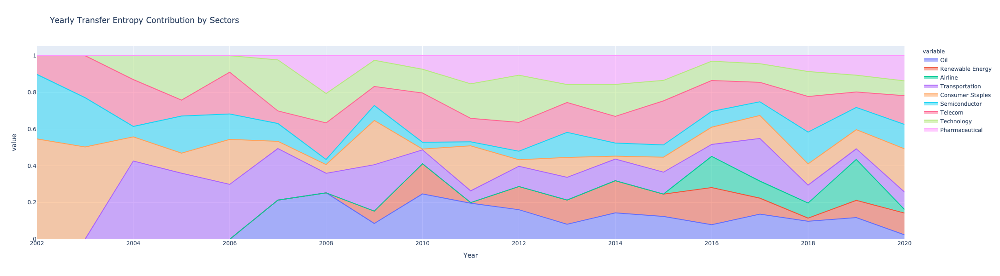

In [72]:
px.area(data, x='Year', y=list(industries.values()), title='Yearly Transfer Entropy Contribution by Sectors', width=1000, height=600)

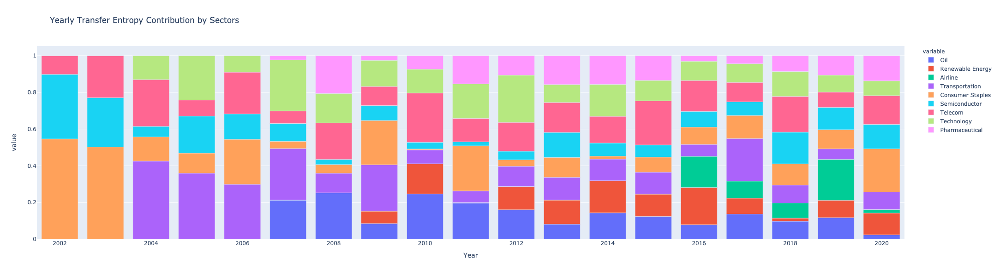

In [73]:
px.bar(data, x='Year', y=list(industries.values()), title='Yearly Transfer Entropy Contribution by Sectors', width=1000, height=600)

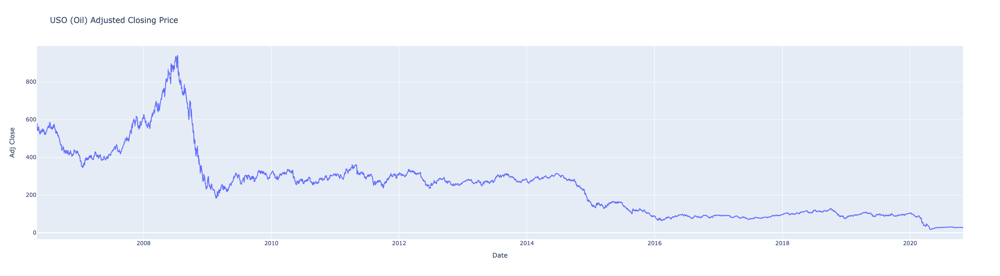

In [127]:
df = pd.read_csv('data/etf/USO.csv')
px.line(df, x='Date', y='Adj Close', width=1000, height=600, title='USO (Oil) Adjusted Closing Price')

## Net information flow between industries

### Oil & Transportation

In [73]:
selected_ind = ['USO', 'IYT']
cols = ['year', f'{selected_ind[0]}to{selected_ind[1]}', f'{selected_ind[1]}to{selected_ind[0]}']
K = 4
yearly_stats = []

for yr in range(2000, 2021):
    t_data = etf.loc[etf['date'].dt.year == yr, selected_ind].copy()
    t_data.dropna(inplace=True)
    if len(t_data) > K:
        row = [yr]
        row += calc.transfer_entropy(src=t_data[selected_ind[0]].values, dest=t_data[selected_ind[1]].values, nearest_neighbors=K),
        row += calc.transfer_entropy(src=t_data[selected_ind[1]].values, dest=t_data[selected_ind[0]].values, nearest_neighbors=K),
        yearly_stats += row,

yearly = pd.DataFrame(yearly_stats, columns=cols)
f = lambda x: max(0, x)
yearly[cols[1]] = yearly[cols[1]].apply(f)
yearly[cols[2]] = yearly[cols[2]].apply(f)
yearly['net_info_flow'] = yearly[cols[1]] - yearly[cols[2]]

In [74]:
yearly.describe()

,year,USOtoIYT,IYTtoUSO,net_info_flow
count,15.000000,15.000000,15.000000,15.000000
mean,2013.000000,0.015166,0.005575,0.009590
std,4.472136,0.021157,0.012192,0.018208
min,2006.000000,0.000000,0.000000,-0.010429
25%,2009.500000,0.000000,0.000000,0.000000
50%,2013.000000,0.002459,0.000000,0.002459
75%,2016.500000,0.021527,0.006197,0.015548
max,2020.000000,0.058124,0.046387,0.057743


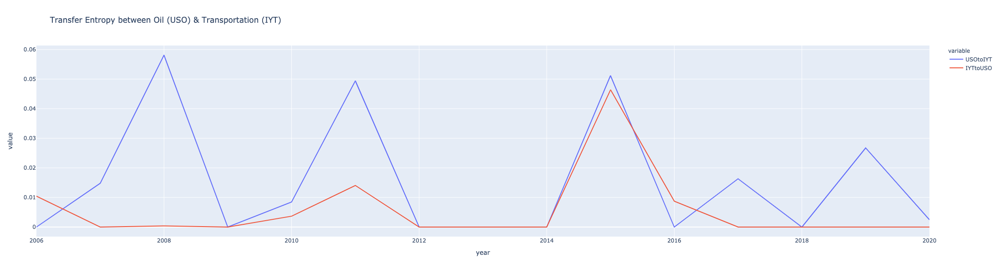

In [75]:
px.line(yearly, x='year', y=cols[1:], title=f'Transfer Entropy between {industries[selected_ind[0]]} ({selected_ind[0]}) & {industries[selected_ind[1]]} ({selected_ind[1]})', height=600, width=1000)

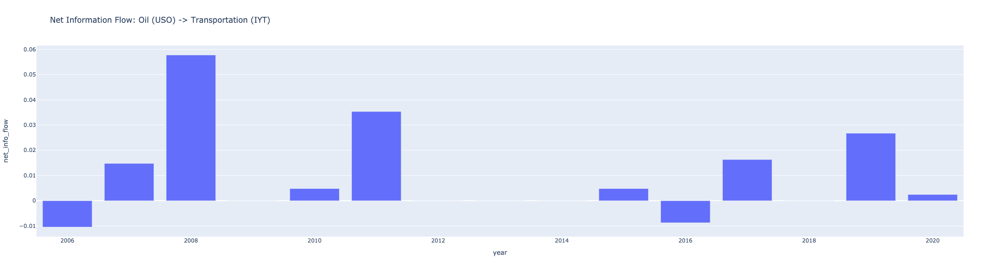

In [76]:
px.bar(yearly, x='year', y='net_info_flow', title=f'Net Information Flow: {industries[selected_ind[0]]} ({selected_ind[0]}) -> {industries[selected_ind[1]]} ({selected_ind[1]})', height=600, width=1000)

In [77]:
print(f'Net Information Flow {selected_ind[0]} -> {selected_ind[1]}')
yearly.style.bar(subset=[col for col in yearly.columns if col != 'year'], align='mid', color=['#d65f5f', '#5fba7d'], axis=None)

Net Information Flow USO -> IYT


,year,USOtoIYT,IYTtoUSO,net_info_flow
0,2006,0.000000,0.010429,-0.010429
1,2007,0.014782,0.000000,0.014782
2,2008,0.058124,0.000381,0.057743
3,2009,0.000000,0.000000,0.000000
4,2010,0.008479,0.003672,0.004807
5,2011,0.049397,0.014039,0.035358
6,2012,0.000000,0.000000,0.000000
7,2013,0.000000,0.000000,0.000000
8,2014,0.000000,0.000000,0.000000
9,2015,0.051190,0.046387,0.004803


### Oil & Renewable Energy

In [78]:
selected_ind = ['USO', 'ICLN']
cols = ['year', f'{selected_ind[0]}to{selected_ind[1]}', f'{selected_ind[1]}to{selected_ind[0]}']
K = 4
yearly_stats = []

for yr in range(2000, 2021):
    t_data = etf.loc[etf['date'].dt.year == yr, selected_ind].copy()
    t_data.dropna(inplace=True)
    if len(t_data) > K:
        row = [yr]
        row += calc.transfer_entropy(src=t_data[selected_ind[0]].values, dest=t_data[selected_ind[1]].values, nearest_neighbors=K),
        row += calc.transfer_entropy(src=t_data[selected_ind[1]].values, dest=t_data[selected_ind[0]].values, nearest_neighbors=K),
        yearly_stats += row,

yearly = pd.DataFrame(yearly_stats, columns=cols)
f = lambda x: max(0, x)
yearly[cols[1]] = yearly[cols[1]].apply(f)
yearly[cols[2]] = yearly[cols[2]].apply(f)
yearly['net_info_flow'] = yearly[cols[1]] - yearly[cols[2]]

In [79]:
yearly.describe()

,year,USOtoICLN,ICLNtoUSO,net_info_flow
count,13.00000,13.000000,13.000000,13.000000
mean,2014.00000,0.014307,0.011559,0.002747
std,3.89444,0.022215,0.017292,0.033181
min,2008.00000,0.000000,0.000000,-0.040631
25%,2011.00000,0.000000,0.000000,-0.019226
50%,2014.00000,0.005174,0.000000,0.000000
75%,2017.00000,0.016212,0.019226,0.016212
max,2020.00000,0.074654,0.040689,0.074654


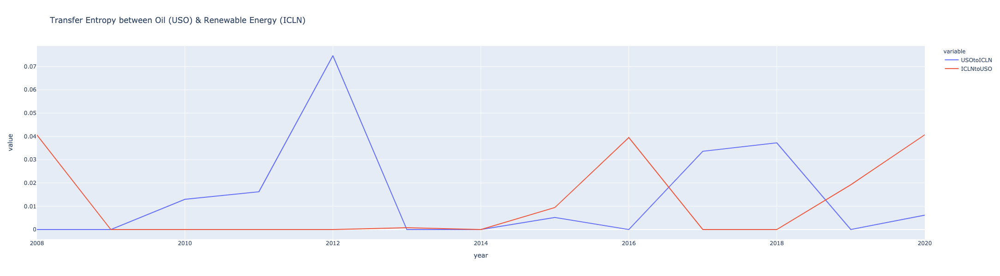

In [80]:
px.line(yearly, x='year', y=cols[1:], title=f'Transfer Entropy between {industries[selected_ind[0]]} ({selected_ind[0]}) & {industries[selected_ind[1]]} ({selected_ind[1]})', height=600, width=1000)

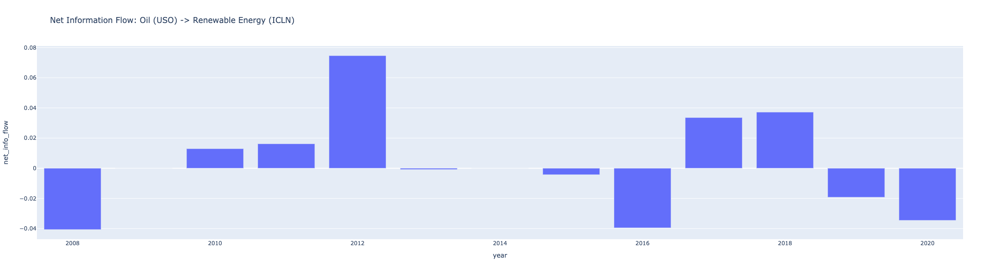

In [81]:
px.bar(yearly, x='year', y='net_info_flow', title=f'Net Information Flow: {industries[selected_ind[0]]} ({selected_ind[0]}) -> {industries[selected_ind[1]]} ({selected_ind[1]})', height=600, width=1000)

In [82]:
print(f'Net Information Flow {selected_ind[0]} -> {selected_ind[1]}')
yearly.style.bar(subset=[col for col in yearly.columns if col != 'year'], align='mid', color=['#d65f5f', '#5fba7d'], axis=None)

Net Information Flow USO -> ICLN


,year,USOtoICLN,ICLNtoUSO,net_info_flow
0,2008,0.000000,0.040631,-0.040631
1,2009,0.000000,0.000000,0.000000
2,2010,0.012985,0.000000,0.012985
3,2011,0.016212,0.000000,0.016212
4,2012,0.074654,0.000000,0.074654
5,2013,0.000000,0.000790,-0.000790
6,2014,0.000000,0.000000,0.000000
7,2015,0.005174,0.009446,-0.004272
8,2016,0.000000,0.039486,-0.039486
9,2017,0.033601,0.000000,0.033601


### Oil & Technology

In [83]:
selected_ind = ['USO', 'VGT']
cols = ['year', f'{selected_ind[0]}to{selected_ind[1]}', f'{selected_ind[1]}to{selected_ind[0]}']
K = 4
yearly_stats = []

for yr in range(2000, 2021):
    t_data = etf.loc[etf['date'].dt.year == yr, selected_ind].copy()
    t_data.dropna(inplace=True)
    if len(t_data) > K:
        row = [yr]
        row += calc.transfer_entropy(src=t_data[selected_ind[0]].values, dest=t_data[selected_ind[1]].values, nearest_neighbors=K),
        row += calc.transfer_entropy(src=t_data[selected_ind[1]].values, dest=t_data[selected_ind[0]].values, nearest_neighbors=K),
        yearly_stats += row,

yearly = pd.DataFrame(yearly_stats, columns=cols)
f = lambda x: max(0, x)
yearly[cols[1]] = yearly[cols[1]].apply(f)
yearly[cols[2]] = yearly[cols[2]].apply(f)
yearly['net_info_flow'] = yearly[cols[1]] - yearly[cols[2]]

In [84]:
yearly.describe()

,year,USOtoVGT,VGTtoUSO,net_info_flow
count,15.000000,15.000000,15.000000,15.000000
mean,2013.000000,0.012530,0.023137,-0.010608
std,4.472136,0.017175,0.022957,0.028284
min,2006.000000,0.000000,0.000000,-0.043547
25%,2009.500000,0.000000,0.000619,-0.033670
50%,2013.000000,0.001089,0.015165,-0.005103
75%,2016.500000,0.022359,0.041073,0.000000
max,2020.000000,0.050778,0.068384,0.050778


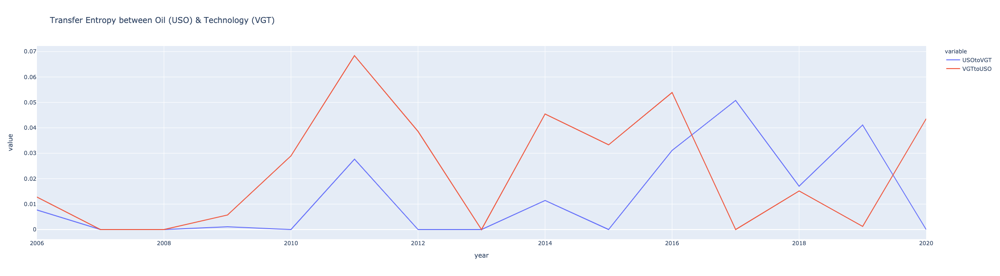

In [85]:
px.line(yearly, x='year', y=cols[1:], title=f'Transfer Entropy between {industries[selected_ind[0]]} ({selected_ind[0]}) & {industries[selected_ind[1]]} ({selected_ind[1]})', height=600, width=1000)

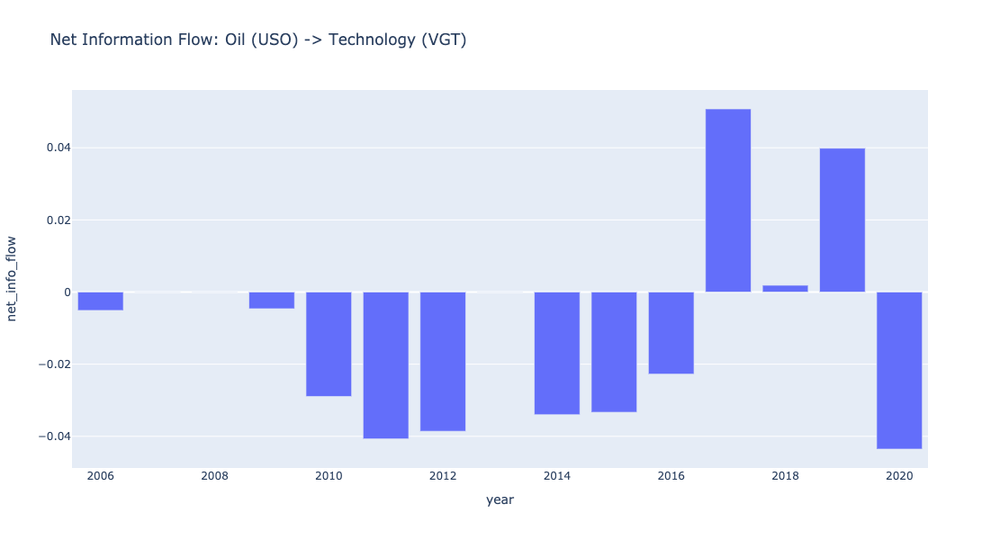

In [86]:
px.bar(yearly, x='year', y='net_info_flow', title=f'Net Information Flow: {industries[selected_ind[0]]} ({selected_ind[0]}) -> {industries[selected_ind[1]]} ({selected_ind[1]})', height=600, width=1000)

In [87]:
print(f'Net Information Flow {selected_ind[0]} -> {selected_ind[1]}')
yearly.style.bar(subset=[col for col in yearly.columns if col != 'year'], align='mid', color=['#d65f5f', '#5fba7d'], axis=None)

Net Information Flow USO -> VGT


,year,USOtoVGT,VGTtoUSO,net_info_flow
0,2006,0.007685,0.012788,-0.005103
1,2007,0.000000,0.000000,0.000000
2,2008,0.000000,0.000000,0.000000
3,2009,0.001089,0.005717,-0.004628
4,2010,0.000000,0.028965,-0.028965
5,2011,0.027670,0.068384,-0.040714
6,2012,0.000000,0.038599,-0.038599
7,2013,0.000000,0.000000,0.000000
8,2014,0.011442,0.045446,-0.034004
9,2015,0.000000,0.033336,-0.033336


### Semiconductor & Technology

In [88]:
selected_ind = ['SMH', 'VGT']
cols = ['year', f'{selected_ind[0]}to{selected_ind[1]}', f'{selected_ind[1]}to{selected_ind[0]}']
K = 4
yearly_stats = []

for yr in range(2000, 2021):
    t_data = etf.loc[etf['date'].dt.year == yr, selected_ind].copy()
    t_data.dropna(inplace=True)
    if len(t_data) > K:
        row = [yr]
        row += calc.transfer_entropy(src=t_data[selected_ind[0]].values, dest=t_data[selected_ind[1]].values, nearest_neighbors=K),
        row += calc.transfer_entropy(src=t_data[selected_ind[1]].values, dest=t_data[selected_ind[0]].values, nearest_neighbors=K),
        yearly_stats += row,

yearly = pd.DataFrame(yearly_stats, columns=cols)
f = lambda x: max(0, x)
yearly[cols[1]] = yearly[cols[1]].apply(f)
yearly[cols[2]] = yearly[cols[2]].apply(f)
yearly['net_info_flow'] = yearly[cols[1]] - yearly[cols[2]]

In [89]:
yearly.describe()

,year,SMHtoVGT,VGTtoSMH,net_info_flow
count,17.000000,17.000000,17.000000,17.000000
mean,2012.000000,0.012225,0.005526,0.006698
std,5.049752,0.021376,0.012672,0.013850
min,2004.000000,0.000000,0.000000,-0.020193
25%,2008.000000,0.000000,0.000000,0.000000
50%,2012.000000,0.001628,0.000000,0.000000
75%,2016.000000,0.015738,0.003988,0.013852
max,2020.000000,0.081237,0.049729,0.034109


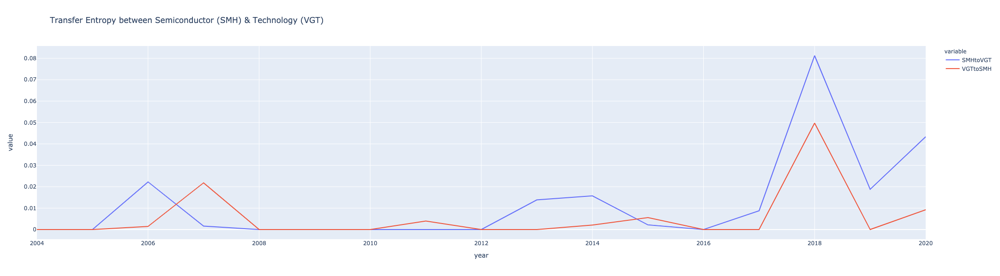

In [90]:
px.line(yearly, x='year', y=cols[1:], title=f'Transfer Entropy between {industries[selected_ind[0]]} ({selected_ind[0]}) & {industries[selected_ind[1]]} ({selected_ind[1]})', height=600, width=1000)

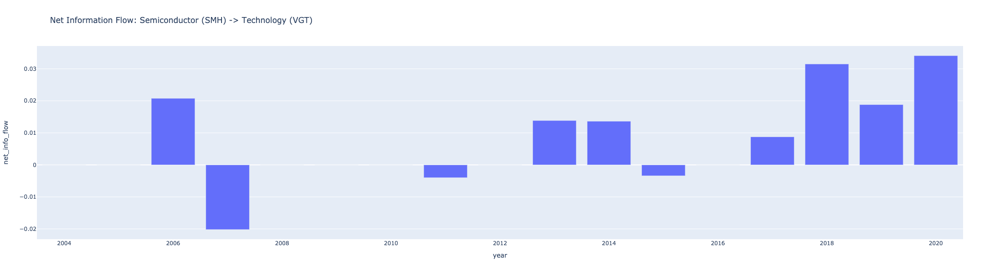

In [91]:
px.bar(yearly, x='year', y='net_info_flow', title=f'Net Information Flow: {industries[selected_ind[0]]} ({selected_ind[0]}) -> {industries[selected_ind[1]]} ({selected_ind[1]})', height=600, width=1000)

In [92]:
print(f'Net Information Flow {selected_ind[0]} -> {selected_ind[1]}')
yearly.style.bar(subset=[col for col in yearly.columns if col != 'year'], align='mid', color=['#d65f5f', '#5fba7d'], axis=None)

Net Information Flow SMH -> VGT


,year,SMHtoVGT,VGTtoSMH,net_info_flow
0,2004,0.000000,0.000000,0.000000
1,2005,0.000000,0.000000,0.000000
2,2006,0.022229,0.001455,0.020774
3,2007,0.001628,0.021820,-0.020193
4,2008,0.000000,0.000000,0.000000
5,2009,0.000000,0.000000,0.000000
6,2010,0.000000,0.000000,0.000000
7,2011,0.000000,0.003988,-0.003988
8,2012,0.000000,0.000000,0.000000
9,2013,0.013852,0.000000,0.013852


### Transportation & Renewable Energy

In [93]:
selected_ind = ['IYT', 'ICLN']
cols = ['year', f'{selected_ind[0]}to{selected_ind[1]}', f'{selected_ind[1]}to{selected_ind[0]}']
K = 4
yearly_stats = []

for yr in range(2000, 2021):
    t_data = etf.loc[etf['date'].dt.year == yr, selected_ind].copy()
    t_data.dropna(inplace=True)
    if len(t_data) > K:
        row = [yr]
        row += calc.transfer_entropy(src=t_data[selected_ind[0]].values, dest=t_data[selected_ind[1]].values, nearest_neighbors=K),
        row += calc.transfer_entropy(src=t_data[selected_ind[1]].values, dest=t_data[selected_ind[0]].values, nearest_neighbors=K),
        yearly_stats += row,

yearly = pd.DataFrame(yearly_stats, columns=cols)
f = lambda x: max(0, x)
yearly[cols[1]] = yearly[cols[1]].apply(f)
yearly[cols[2]] = yearly[cols[2]].apply(f)
yearly['net_info_flow'] = yearly[cols[1]] - yearly[cols[2]]

In [94]:
yearly.describe()

,year,IYTtoICLN,ICLNtoIYT,net_info_flow
count,13.00000,13.000000,13.000000,13.000000
mean,2014.00000,0.014076,0.009527,0.004549
std,3.89444,0.024133,0.021796,0.025976
min,2008.00000,0.000000,0.000000,-0.040289
25%,2011.00000,0.000000,0.000000,0.000000
50%,2014.00000,0.000000,0.000000,0.000000
75%,2017.00000,0.029084,0.011814,0.002226
max,2020.00000,0.078221,0.079073,0.078221


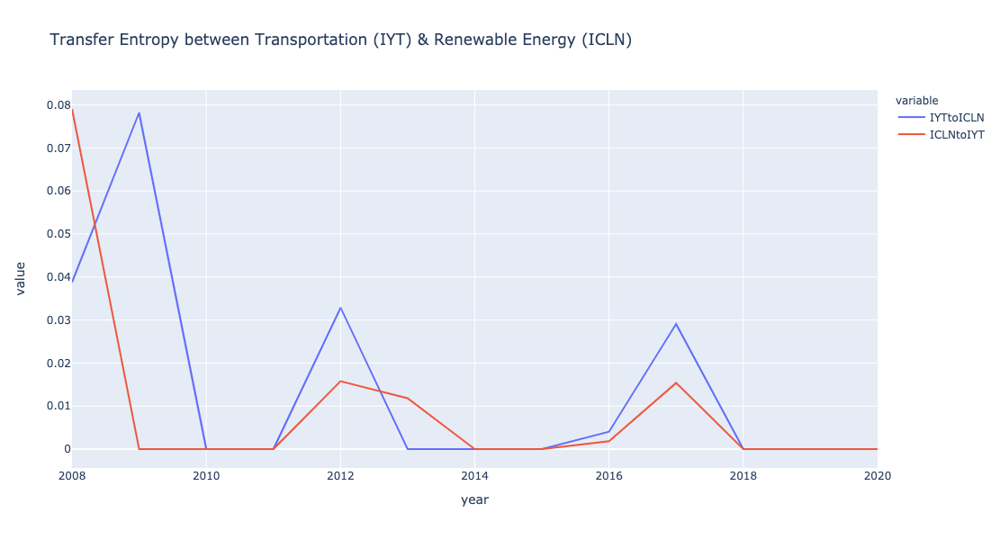

In [95]:
px.line(yearly, x='year', y=cols[1:], title=f'Transfer Entropy between {industries[selected_ind[0]]} ({selected_ind[0]}) & {industries[selected_ind[1]]} ({selected_ind[1]})', height=600, width=1000)

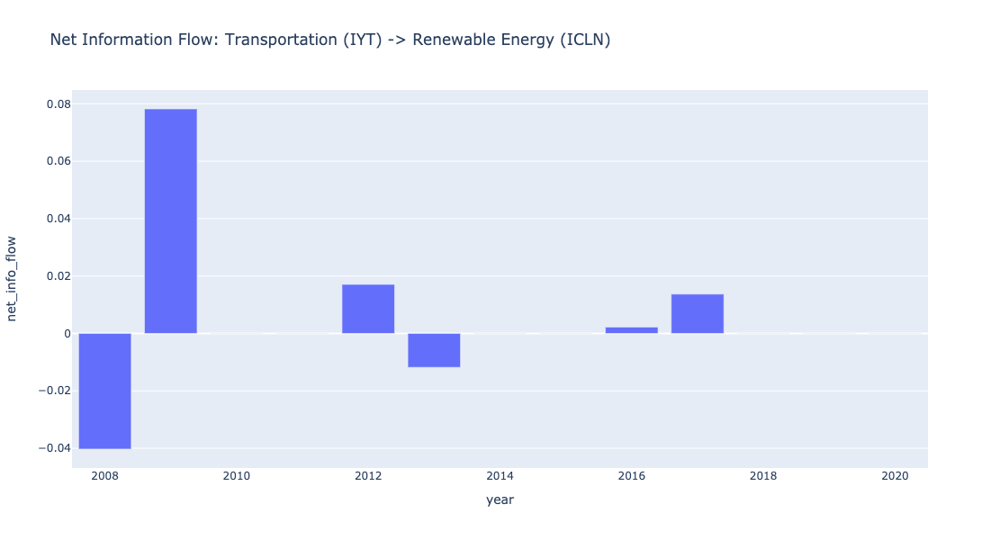

In [96]:
px.bar(yearly, x='year', y='net_info_flow', title=f'Net Information Flow: {industries[selected_ind[0]]} ({selected_ind[0]}) -> {industries[selected_ind[1]]} ({selected_ind[1]})', width=1000, height=600)

In [97]:
print(f'Net Information Flow {selected_ind[0]} -> {selected_ind[1]}')
yearly.style.bar(subset=[col for col in yearly.columns if col != 'year'], align='mid', color=['#d65f5f', '#5fba7d'], axis=None)

Net Information Flow IYT -> ICLN


,year,IYTtoICLN,ICLNtoIYT,net_info_flow
0,2008,0.038783,0.079073,-0.040289
1,2009,0.078221,0.000000,0.078221
2,2010,0.000000,0.000000,0.000000
3,2011,0.000000,0.000000,0.000000
4,2012,0.032854,0.015767,0.017087
5,2013,0.000000,0.011814,-0.011814
6,2014,0.000000,0.000000,0.000000
7,2015,0.000000,0.000000,0.000000
8,2016,0.004040,0.001815,0.002226
9,2017,0.029084,0.015384,0.013700


# Company level information transfer

| Index   | Name              |Industry        | Source                                          |
|---------|-------------------|----------------|-------------------------------------------------|
| `XOM`   | ExxonMobil        |Oil             | [Link](https://finance.yahoo.com/quote/XOM/)    |
| `DAL`   | Delta Airline     |Airline         | [Link](https://finance.yahoo.com/quote/DAL/)    |

In [5]:
delta = pd.read_csv('data/DAL.csv')
exxon = pd.read_csv('data/XOM.csv')

In [6]:
for df in [delta, exxon]:
    df.columns = [col.lower().replace(' ', '_') for col in df.columns]
    df['date'] = pd.to_datetime(df['date'])
    df['daily_return'] = daily_return(df)

In [7]:
cols = ['date', 'daily_return']
df = pd.merge(delta[cols], exxon[cols], on='date', how='inner')
df = df.iloc[1:,:]
df.columns = ['date', 'Delta', 'Exxon']
df

,date,Delta,Exxon
1,2007-05-07,-0.029997,0.003470
2,2007-05-08,-0.036514,0.006781
3,2007-05-09,0.008118,0.000491
4,2007-05-10,-0.004558,-0.020940
5,2007-05-11,-0.020514,0.022912
...,...,...,...
3394,2020-10-26,-0.062815,-0.023998
3395,2020-10-27,-0.038958,-0.016020
3396,2020-10-28,-0.035126,-0.038831
3397,2020-10-29,0.036753,0.043391


In [8]:
selected = ['Exxon', 'Delta']
cols = ['year', f'{selected[0]}To{selected[1]}', f'{selected[1]}To{selected[0]}']
K = 4
yearly_stats = []

for yr in range(2007, 2021):
    t_data = df.loc[df['date'].dt.year == yr, selected].copy()
    t_data.dropna(inplace=True)
    if len(t_data) > K:
        row = [yr]
        row += calc.transfer_entropy(src=t_data[selected[0]].values, dest=t_data[selected[1]].values, nearest_neighbors=K),
        row += calc.transfer_entropy(src=t_data[selected[1]].values, dest=t_data[selected[0]].values, nearest_neighbors=K),
        yearly_stats += row,

yearly = pd.DataFrame(yearly_stats, columns=cols)
f = lambda x: max(0, x)
yearly[cols[1]] = yearly[cols[1]].apply(f)
yearly[cols[2]] = yearly[cols[2]].apply(f)
yearly['net_info_flow'] = yearly[cols[1]] - yearly[cols[2]]

In [9]:
print(f'Net Information Flow {selected[0]} -> {selected[1]}')
yearly.style.bar(subset=['net_info_flow'], align='mid', color=['#d65f5f', '#5fba7d'])

Net Information Flow Exxon -> Delta


,year,ExxonToDelta,DeltaToExxon,net_info_flow
0,2007,0.000000,0.027230,-0.027230
1,2008,0.000000,0.015746,-0.015746
2,2009,0.030754,0.055017,-0.024263
3,2010,0.015983,0.000000,0.015983
4,2011,0.004166,0.000000,0.004166
5,2012,0.000000,0.000000,0.000000
6,2013,0.000000,0.000000,0.000000
7,2014,0.000000,0.000000,0.000000
8,2015,0.000000,0.032663,-0.032663
9,2016,0.049049,0.003398,0.045651


In [10]:
print(f'Net Information Flow {selected[0]} -> {selected[1]}')
yearly.style.bar(subset=['net_info_flow'], align='mid', color=['#d65f5f', '#5fba7d'])

Net Information Flow Exxon -> Delta


,year,ExxonToDelta,DeltaToExxon,net_info_flow
0,2007,0.000000,0.027230,-0.027230
1,2008,0.000000,0.015746,-0.015746
2,2009,0.030754,0.055017,-0.024263
3,2010,0.015983,0.000000,0.015983
4,2011,0.004166,0.000000,0.004166
5,2012,0.000000,0.000000,0.000000
6,2013,0.000000,0.000000,0.000000
7,2014,0.000000,0.000000,0.000000
8,2015,0.000000,0.032663,-0.032663
9,2016,0.049049,0.003398,0.045651


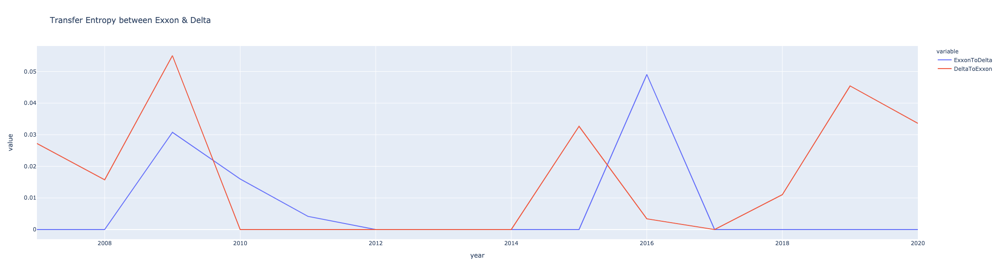

In [11]:
px.line(yearly, x='year', y=cols[1:], title=f'Transfer Entropy between {selected[0]} & {selected[1]}', height=600, width=1000)

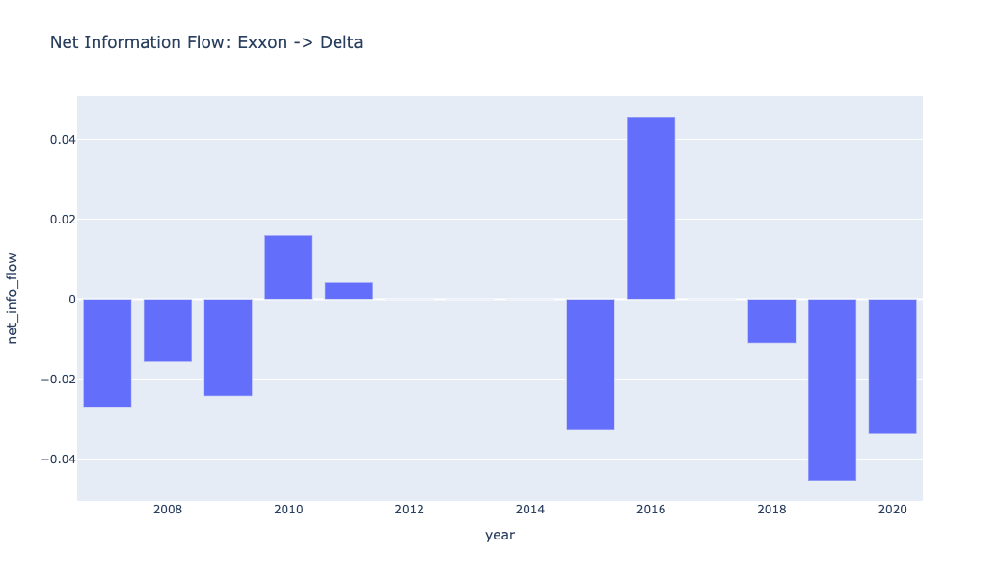

In [12]:
yearly['net_info_flow'] = yearly[cols[1]].apply(f) - yearly[cols[2]].apply(f)
px.bar(yearly, x='year', y='net_info_flow', title=f'Net Information Flow: {selected[0]} -> {selected[1]}', width=1000, height=600)

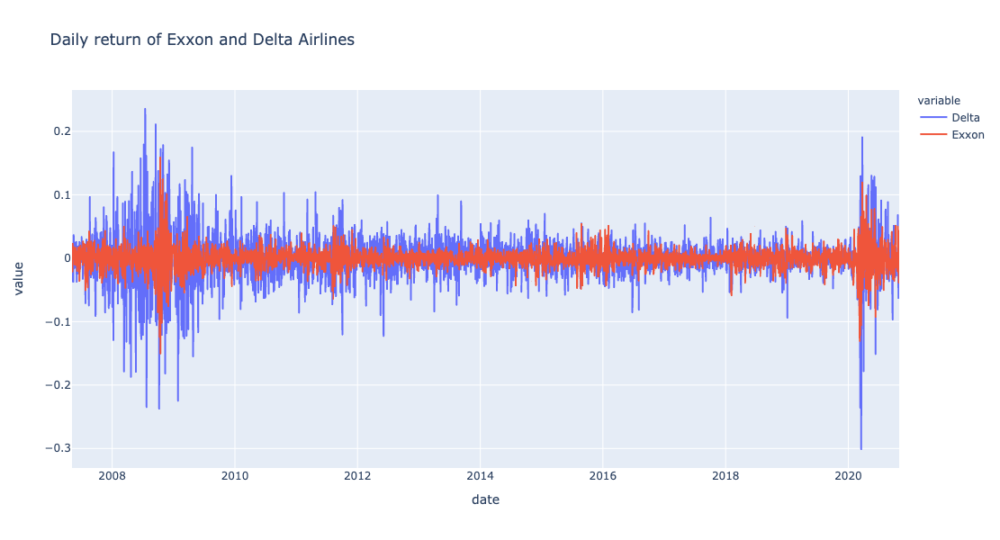

In [13]:
px.line(df, x='date', y=['Delta', 'Exxon'], title='Daily return of Exxon and Delta Airlines', width=1000, height=600)

**Articles on Exxon Mobil from 2016:** [Link](https://www.google.com/search?q=exxon&biw=2560&bih=1329&sxsrf=ALeKk02l5xfb6YrlAioSV7MQNEUKYtQMVA%3A1604648641840&source=lnt&tbs=cdr%3A1%2Ccd_min%3A1%2F1%2F2016%2Ccd_max%3A1%2F1%2F2017&tbm=nws)

<img src='img/exxon.png' width=600 height=1200>